In [2]:
import json
import os
import glob
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [6]:
import os
import re 

images = sorted(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/labels'))

imagesets = [re.sub('.txt', '', i) for i in images]

with open('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/ImageSets/test.txt', 'w') as f:
    f.write('\n'.join(imagesets))

In [2]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/jsons'))

12580

In [3]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/labels'))

12570

In [4]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/points'))

12570

In [7]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/custom_infos_val.pkl', 'rb') as f:
    print(len(pkl.load(f)))

12570


In [3]:
import json

with open('/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/Suwon_A_2210261926_0313/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open('/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/Suwon_A_2210261926_0313/label/0000.json', 'r') as f:
    label = json.load(f)

In [154]:
def tmp_roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)

In [9]:
R_tmp = roty(label[label_num]['psr']['rotation']['z'])
R_tmp

array([[ 7.84590957e-02, -6.10435811e-17,  9.96917334e-01],
       [ 9.96917334e-01,  4.80423402e-18, -7.84590957e-02],
       [ 0.00000000e+00,  1.00000000e+00,  6.12323400e-17]])

In [10]:
Rxyz = np.matmul(R_tmp, np.asarray(list(xyz.values())))
Rxyz

array([ 19.86172134,  -1.60258162, -12.4104858 ])

In [6]:
np.asarray(list(xyz.values()))

array([ -0.0393087 , -12.4104858 ,  19.92623138])

In [192]:
x, y, z

(-0.03930870116065664, -12.410485798791402, 19.926231384277344)

In [25]:
x_corners

[2.358582406895649,
 2.358582406895649,
 -2.358582406895649,
 -2.358582406895649,
 2.358582406895649,
 2.358582406895649,
 -2.358582406895649,
 -2.358582406895649]

In [24]:
corners_3d

array([[ 2.35858241,  2.35858241, -2.35858241, -2.35858241,  2.35858241,
         2.35858241, -2.35858241, -2.35858241],
       [-0.99217879,  0.99217879,  0.99217879, -0.99217879, -0.99217879,
         0.99217879,  0.99217879, -0.99217879],
       [ 0.89097977,  0.89097977,  0.89097977,  0.89097977, -0.89097977,
        -0.89097977, -0.89097977, -0.89097977],
       [ 1.        ,  1.        ,  1.        ,  1.        ,  1.        ,
         1.        ,  1.        ,  1.        ]])

In [18]:
corners_3d

array([[-11.23631333, -13.21455379, -13.58465827, -11.60641781,
        -11.23631333, -13.21455379, -13.58465827, -11.60641781],
       [  0.67088461,   0.82657551,  -3.87604786,  -4.03173876,
          0.67088461,   0.82657551,  -3.87604786,  -4.03173876],
       [ 20.7527011 ,  20.7527011 ,  20.7527011 ,  20.7527011 ,
         18.97074157,  18.97074157,  18.97074157,  18.97074157],
       [  1.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ]])

In [14]:
corners_3d

array([[ 22.22030374,  22.22030374,  17.50313893,  17.50313893,
         22.22030374,  22.22030374,  17.50313893,  17.50313893],
       [ -2.59476041,  -0.61040284,  -0.61040284,  -2.59476041,
         -2.59476041,  -0.61040284,  -0.61040284,  -2.59476041],
       [-11.51950603, -11.51950603, -11.51950603, -11.51950603,
        -13.30146557, -13.30146557, -13.30146557, -13.30146557],
       [  1.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ]])

In [16]:
corners_3d

array([[  1.13486377,  -0.84337669,  -1.21348117,   0.76475929,
          1.13486377,  -0.84337669,  -1.21348117,   0.76475929],
       [-10.13701956,  -9.98132866, -14.68395203, -14.83964293,
        -10.13701956,  -9.98132866, -14.68395203, -14.83964293],
       [ 20.81721115,  20.81721115,  20.81721115,  20.81721115,
         19.03525162,  19.03525162,  19.03525162,  19.03525162],
       [  1.        ,   1.        ,   1.        ,   1.        ,
          1.        ,   1.        ,   1.        ,   1.        ]])

In [27]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, Y, X)
    # return Z * Y * X

roty(t)

array([[ 3.74939946e-33, -1.00000000e+00,  6.12323400e-17],
       [ 6.12323400e-17,  6.12323400e-17,  1.00000000e+00],
       [-1.00000000e+00,  0.00000000e+00,  6.12323400e-17]])

In [35]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, np.matmul(Y, X))
    # return Z * Y * X

roty(t)

array([[ 3.74939946e-33,  0.00000000e+00,  1.00000000e+00],
       [ 6.12323400e-17,  1.00000000e+00,  0.00000000e+00],
       [-1.00000000e+00,  6.12323400e-17,  3.74939946e-33]])

In [32]:
t = 0
Rx = 90
Ry = 90
Rz = 90
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = Rz / 180*np.pi

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    # return np.matmul(Z, Y, X)
    return Z @ Y @ X

roty(t)

array([[ 3.74939946e-33,  0.00000000e+00,  1.00000000e+00],
       [ 6.12323400e-17,  1.00000000e+00,  0.00000000e+00],
       [-1.00000000e+00,  6.12323400e-17,  3.74939946e-33]])

(161.0, 751.0, 494.0, 950.0)

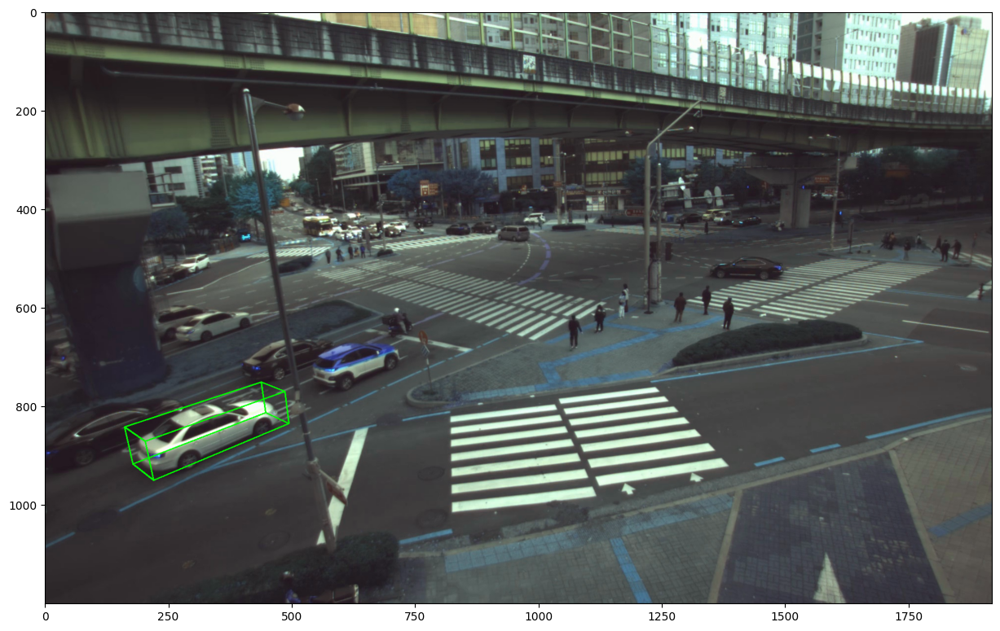

In [4]:
import json

scene = 'Suwon_A_2210261635_0000'
label_num = 10

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    # X = np.array([[1, 0, 0],
    #                 [0, np.cos(Rx), -np.sin(Rx)],
    #                 [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    # return np.matmul(Z, X)
    return Z
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

# xyz = np.asarray(list(xyz.values()))


x = xyz['x']
y = xyz['y']
z = xyz['z']
# x = Rxyz[0]
# y = Rxyz[1]
# z = Rxyz[2]
l = lwh['x']
h = lwh['y']
w = lwh['z']

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])
# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, np.matmul(extr, corners_3d))

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

(177.0, 754.0, 500.0, 959.0)

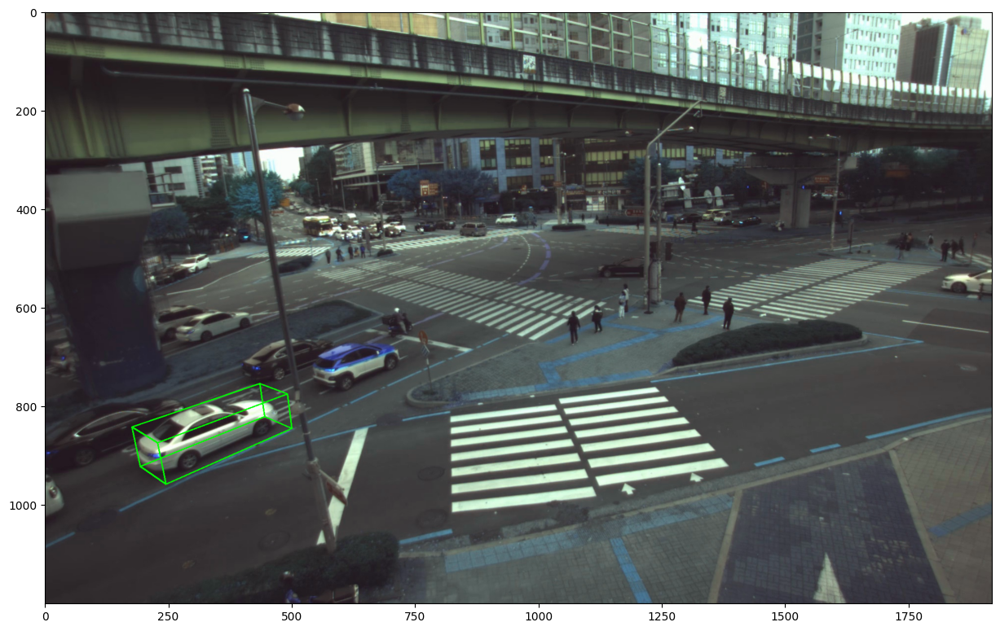

In [16]:
import json

scene = 'Suwon_A_2210261635_0000'
label_num = 8

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0001.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    c = np.cos(t)
    s = np.sin(t)
    # return  np.array([[c, 0, s],
    #                 [0, 1, 0],
    #                 [-s, 0, c]])

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    # X = np.eye(3)

    Z = np.array([[c, -s, 0],
                    [s, c, 0],
                    [0, 0, 1]])
    
    return np.matmul(Z, X)
    # return Z
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

# xyz = np.asarray(list(xyz.values()))


# x = xyz['x']
# y = xyz['y']
# z = xyz['z']
# # x = Rxyz[0]
# # y = Rxyz[1]
# # z = Rxyz[2]
# l = lwh['x']
# h = lwh['y']
# w = lwh['z']
# x = 6.6894274
# y = -22.088873
# z = -12.605721

# x = 6.6894274
# y = -22.088873
# z = -12.605721
# l = 3.9606273
# w = 1.648592
# h = 1.37899
# R = roty(4.045456)

x = 10.293464
y = -16.148974
z = -13.023260
l = 4.434395
w = 1.847344
h = 1.474726
R = roty(-2.151517)

# x = 18.151434
# y = -30.606922
# z = -13.159989
# l = 4.060978
# w = 1.7086368
# h = 1.3965247
# R = roty(4.2575893)

# x = -4.856326	
# y = -26.015396	
# z = -11.578309	
# l = 0.441090
# w = 0.477765
# h = 1.421249	
# R = roty(5.193722)

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])
# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, np.matmul(extr, corners_3d))

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [25]:
extr.T[:4, :3]

array([[-9.999970e-01, -2.249580e-03, -1.335190e-03],
       [ 6.981240e-04,  2.623970e-01, -9.649600e-01],
       [ 2.521110e-03, -9.649570e-01, -2.623940e-01],
       [-1.612331e-01, -4.315770e+00, -1.141710e+00]])

In [33]:
np.dot(corners_3d.T, extr.T[:4, :3])

array([[ -8.50919495,   2.93002529,  18.9538388 ],
       [-10.05440212,   2.6606109 ,  19.92976556],
       [-12.48463366,   3.62796273,  16.34897296],
       [-10.93942649,   3.89737712,  15.3730462 ],
       [ -8.5129129 ,   4.35307247,  19.34079805],
       [-10.05812007,   4.08365808,  20.31672481],
       [-12.48835161,   5.05100991,  16.73593221],
       [-10.94314443,   5.3204243 ,  15.76000545]])

In [34]:
np.dot(corners_3d.T, extr.T)

array([[ -8.50919495,   2.93002529,  18.9538388 ,   1.        ],
       [-10.05440212,   2.6606109 ,  19.92976556,   1.        ],
       [-12.48463366,   3.62796273,  16.34897296,   1.        ],
       [-10.93942649,   3.89737712,  15.3730462 ,   1.        ],
       [ -8.5129129 ,   4.35307247,  19.34079805,   1.        ],
       [-10.05812007,   4.08365808,  20.31672481,   1.        ],
       [-12.48835161,   5.05100991,  16.73593221,   1.        ],
       [-10.94314443,   5.3204243 ,  15.76000545,   1.        ]])

In [32]:
intr.T.shape()

array([[1.00037612e+03, 0.00000000e+00, 0.00000000e+00],
       [0.00000000e+00, 1.00072696e+03, 0.00000000e+00],
       [9.40460494e+02, 6.20717418e+02, 1.00000000e+00],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [26]:
pts_2d = np.matmul(np.matmul(corners_3d.T, extr.T), intr.T)

In [27]:
pts_2d[:, 0] /= pts_2d[:, 2]
pts_2d[:, 1] /= pts_2d[:, 2]
pts_2d[:,0:2]

array([[491.34854934, 775.41722946],
       [435.77900523, 754.31382375],
       [176.53915327, 842.78641949],
       [228.59500885, 874.42187529],
       [500.14180997, 845.95305441],
       [445.20827247, 821.86335827],
       [193.97989596, 922.74312565],
       [245.8376166 , 958.55308868]])

In [21]:
pts_2d[:, 0] /= pts_2d[:, 2]
pts_2d[:, 1] /= pts_2d[:, 2]
pts_2d[:,0:2]

array([[491.34854934, 775.41722946],
       [435.77900523, 754.31382375],
       [176.53915327, 842.78641949],
       [228.59500885, 874.42187529],
       [500.14180997, 845.95305441],
       [445.20827247, 821.86335827],
       [193.97989596, 922.74312565],
       [245.8376166 , 958.55308868]])

In [31]:
R

array([[-4.39282366e-01,  5.50080140e-17, -8.98349043e-01],
       [-8.98349043e-01, -2.68982872e-17,  4.39282366e-01],
       [ 0.00000000e+00,  1.00000000e+00,  6.12323400e-17]])

In [32]:
from scipy.spatial.transform import Rotation



In [34]:
Rotation.from_matrix(R).as_euler('zyx', degrees=True)

array([-180.        ,  -63.94189779,  -90.        ])

In [ ]:
Rotation.from_euler()

In [ ]:
Rotation.from_matrix(R).as_euler('y', degrees=True)

In [92]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/train_1st/pointrcnn/kitti_infos_train.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

[{'point_cloud': {'num_features': 4,
   'lidar_idx': 'Suwon_A_2210261635_0000_0000'},
  'image': {'image_idx': 'Suwon_A_2210261635_0000_0000',
   'image_shape': array([1200, 1920], dtype=int32)},
  'calib': {'P2': array([[1.00037610e+03, 0.00000000e+00, 9.40460510e+02, 0.00000000e+00],
          [0.00000000e+00, 1.00072693e+03, 6.20717407e+02, 0.00000000e+00],
          [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
          [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
   'R0_rect': array([[1., 0., 0., 0.],
          [0., 1., 0., 0.],
          [0., 0., 1., 0.],
          [0., 0., 0., 1.]], dtype=float32),
   'Tr_velo_to_cam': array([[-9.99997020e-01,  6.98124000e-04,  2.52111000e-03,
           -1.61233097e-01],
          [-2.24958011e-03,  2.62396991e-01, -9.64956999e-01,
           -4.31577015e+00],
          [-1.33519003e-03, -9.64959979e-01, -2.62394011e-01,
           -1.14171004e+00],
          [ 0.00000000e+00,  0.00000000e+00,  0.0000

In [93]:
train[0]['gt_boxes']

{'point_cloud': {'num_features': 4,
  'lidar_idx': 'Suwon_A_2210261635_0000_0000'},
 'image': {'image_idx': 'Suwon_A_2210261635_0000_0000',
  'image_shape': array([1200, 1920], dtype=int32)},
 'calib': {'P2': array([[1.00037610e+03, 0.00000000e+00, 9.40460510e+02, 0.00000000e+00],
         [0.00000000e+00, 1.00072693e+03, 6.20717407e+02, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
  'R0_rect': array([[1., 0., 0., 0.],
         [0., 1., 0., 0.],
         [0., 0., 1., 0.],
         [0., 0., 0., 1.]], dtype=float32),
  'Tr_velo_to_cam': array([[-9.99997020e-01,  6.98124000e-04,  2.52111000e-03,
          -1.61233097e-01],
         [-2.24958011e-03,  2.62396991e-01, -9.64956999e-01,
          -4.31577015e+00],
         [-1.33519003e-03, -9.64959979e-01, -2.62394011e-01,
          -1.14171004e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         

In [94]:
import pickle as pkl

with open('/data/NIA50/50-2/data/NIA50/train_1st/test/kitti_infos_train.pkl', 'rb') as f:
    train = pkl.load(f)

train[0]

{'point_cloud': {'num_features': 4,
  'lidar_idx': 'Suwon_A_2210261635_0000_0000'},
 'image': {'image_idx': 'Suwon_A_2210261635_0000_0000',
  'image_shape': array([1200, 1920], dtype=int32)},
 'calib': {'P2': array([[1.00037610e+03, 0.00000000e+00, 9.40460510e+02, 0.00000000e+00],
         [0.00000000e+00, 1.00072693e+03, 6.20717407e+02, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 1.00000000e+00, 0.00000000e+00],
         [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
  'R0_rect': array([[1., 0., 0., 0.],
         [0., 1., 0., 0.],
         [0., 0., 1., 0.],
         [0., 0., 0., 1.]], dtype=float32),
  'Tr_velo_to_cam': array([[-9.99997020e-01,  6.98124000e-04,  2.52111000e-03,
          -1.61233097e-01],
         [-2.24958011e-03,  2.62396991e-01, -9.64956999e-01,
          -4.31577015e+00],
         [-1.33519003e-03, -9.64959979e-01, -2.62394011e-01,
          -1.14171004e+00],
         [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         

In [ ]:
import os

sorted(os.listdir('/data/NIA50/50-2/data/NIA50/학습용데이터_pre4/Suwon/jsons'))

12580

(834.0, 593.0, 1032.0, 858.0)

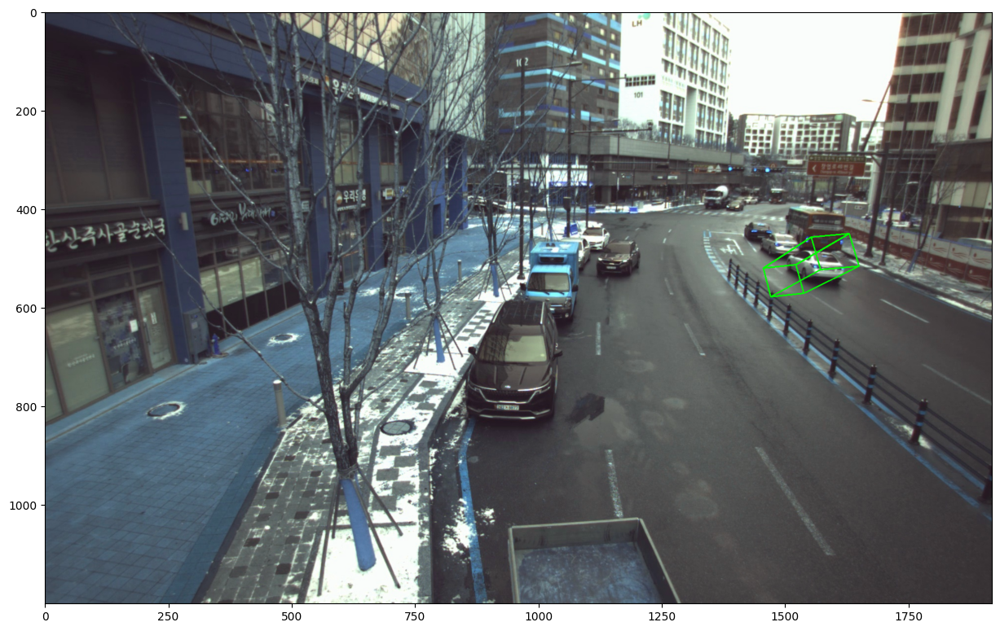

In [83]:
import json

scene = 'Pangyo_D_2212061041_0009'
label_num = 5

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


# def roty(t, Rx=90/180*np.pi):
#     ''' Rotation about the y-axis. '''
#     t = t + 5/180*np.pi
#     c = np.cos(t)
#     s = np.sin(t)
#     return  np.array([[c, 0, s],
#                     [0, 1, 0],
#                     [-s, 0, c]])

#     # X = np.array([[1, 0, 0],
#     #                 [0, np.cos(Rx), -np.sin(Rx)],
#     #                 [0, np.sin(Rx), np.cos(Rx)]])

#     # # X = np.eye(3)

#     # Z = np.array([[c, -s, 0],
#     #                 [s, c, 0],
#     #                 [0, 0, 1]])
    
#     return np.matmul(Z, X)

#     # return np.eye(3)

Rx = -75
Ry = 75
Rz = 18.5
def roty(t, Rx=Rx, Ry=Ry, Rz=Rz):
    Rx = Rx / 180*np.pi
    Ry = Ry / 180*np.pi
    Rz = t + (Rz / 180*np.pi)

    X = np.array([[1, 0, 0],
                    [0, np.cos(Rx), -np.sin(Rx)],
                    [0, np.sin(Rx), np.cos(Rx)]])

    Y = np.array([[np.cos(Ry), 0, np.sin(Ry)],
                    [0, 1, 0],
                    [-np.sin(Ry), 0, np.cos(Ry)]])

    Z = np.array([[np.cos(Rz), -np.sin(Rz), 0],
                    [np.sin(Rz), np.cos(Rz), 0],
                    [0, 0, 1]])
    
    return Z @ Y @ X
                    

xyz = label[label_num]['psr']['position']
R = roty(label[label_num]['psr']['rotation']['z'])
# R = roty(0)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
w = lwh['y']
h = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [1]).T)[:3]
# lwh_ref = R.T @ (extr @ np.hstack((R @ np.asarray(list(lwh.values())).T, [0])).T)[:3].T

# x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
# z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# # corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# # corners_3d = np.vstack([corners_3d, [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]])
# corners_3d = R.T @ (extr @ corners_3d)[:3]
# lwh_ref = np.abs(corners_3d).sum(axis=1)/4
# x = xyz['x']
# y = xyz['y']
# z = xyz['z']
# l = lwh['x']
# w = lwh['y']
# h = lwh['z']

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]
l = lwh_ref[0]
w = lwh_ref[1]
h = lwh_ref[2]

x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = np.vstack([corners_3d, [0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]])
# corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

(834.0, 593.0, 1032.0, 858.0)

(854.0, 621.0, 1020.0, 826.0)

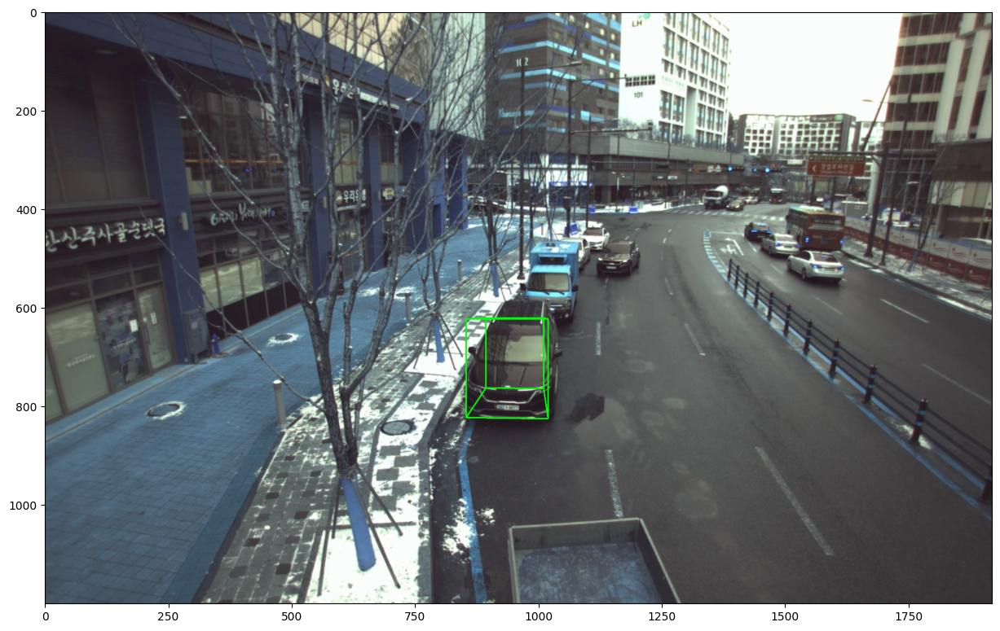

In [10]:
import json

scene = 'Pangyo_D_2212061041_0009'
label_num = 0

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/calib/camera/camera_0.json', 'r') as f:
    calib = json.load(f)    

with open(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/label/0000.json', 'r') as f:
    label = json.load(f)

image = cv2.imread(f'/data/NIA50/50-2/workers/SUSTechPOINTS_aivill_test/data/{scene}/camera/camera_0/0000.jpg')


def draw_projected_box3d(image, qs, color=(0,255,0), thickness=2):
    import cv2
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    if qs is not None:
        qs = qs.astype(np.int32)
        for k in range(0,4):
           i,j=k,(k+1)%4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

           i,j=k+4,(k+1)%4 + 4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

           i,j=k,k+4
           image = cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image


def roty(t, Rx=90/180*np.pi):
    ''' Rotation about the y-axis. '''
    t = t + 90/180*np.pi
    c = np.cos(t)
    s = np.sin(t)
    return  np.array([[c, 0, s],
                    [0, 1, 0],
                    [-s, 0, c]])

    # X = np.array([[1, 0, 0],
    #                 [0, np.cos(Rx), -np.sin(Rx)],
    #                 [0, np.sin(Rx), np.cos(Rx)]])

    # # X = np.eye(3)

    # Z = np.array([[c, -s, 0],
    #                 [s, c, 0],
    #                 [0, 0, 1]])
    
    # return np.matmul(Z, X)
                    

xyz = label[label_num]['psr']['position']
# R = roty(label[label_num]['psr']['rotation']['z'])
R = roty(label[label_num]['psr']['rotation']['z']*-1 - np.pi/2)
lwh = label[label_num]['psr']['scale']

x = xyz['x']
y = xyz['y']
z = xyz['z']
l = lwh['x']
h = lwh['y']
w = lwh['z']

extr = np.asarray(calib['extrinsic']).reshape(4, 4)
intr = np.hstack([np.asarray(calib['intrinsic']).reshape(3, 3), np.asarray([0, 0, 0]).reshape(-1, 1)])

xyz_ref = (extr @ np.asarray(list(xyz.values()) + [1]).T)[:3]

x = xyz_ref[0]
y = xyz_ref[1]
z = xyz_ref[2]


x_corners = [l / 2, l / 2, -l / 2, -l / 2, l / 2, l / 2, -l / 2, -l / 2];
# y_corners = [0, 0, 0, 0, -h, -h, -h, -h];
y_corners = [h / 2, h / 2, h / 2, h / 2, -h / 2, -h / 2, -h / 2, -h / 2];
z_corners = [w / 2, -w / 2, -w / 2, w / 2, w / 2, -w / 2, -w / 2, w / 2];

# corners_3d = np.vstack([x_corners, y_corners, z_corners, [1, 1, 1, 1, 1, 1, 1, 1]])
corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])
# corners_3d = extr @ corners_3d

# print corners_3d.shape
corners_3d[0, :] = corners_3d[0, :] + x  # x  
corners_3d[1, :] = corners_3d[1, :] + y  # y
corners_3d[2, :] = corners_3d[2, :] + z  # z
# corners_3d = np.vstack([corners_3d, [1, 1, 1, 1, 1, 1, 1, 1]])


# proj_mat = np.matmul(viewmatrix, extr)

point2d = np.matmul(intr, corners_3d)

pointx = np.around(point2d/point2d[2]).tolist()[0]
pointy = np.around(point2d/point2d[2]).tolist()[1]
min(pointx), min(pointy), max(pointx), max(pointy)

# qs = np.asarray([pointx[1:3] + pointx[5:7], pointy[1:3] + pointy[5:7]])

img = draw_projected_box3d(image, (point2d/point2d[2])[:2].T)
plt.figure(figsize=(15, 15))
plt.imshow(img)
min(pointx), min(pointy), max(pointx), max(pointy)

In [5]:
label[label_num]['psr']['rotation']['z']*-1 - np.pi/2

-3.082902751244803

In [11]:
xyz

{'x': 0.051941256080759515, 'y': -12.283280975255847, 'z': 19.920872688293457}

In [17]:
np.hstack([xyz_ref, [1]])

array([ 0.1909814 ,  1.13780944, 12.98454737,  1.        ])

In [19]:
extr.T

array([[-9.99825e-01,  3.29349e-03,  1.84150e-02,  0.00000e+00],
       [-1.69222e-02,  2.60414e-01, -9.65349e-01,  0.00000e+00],
       [-7.97488e-03, -9.65491e-01, -2.60313e-01,  0.00000e+00],
       [ 1.93920e-01,  2.35698e+01,  6.31160e+00,  1.00000e+00]])

In [21]:
inverse_rigid_trans(extr) @ np.hstack([xyz_ref, [1]]).T

array([  0.05194087, -12.28327773,  19.92085348,   0.        ])

In [20]:
def inverse_rigid_trans(Tr):
    ''' Inverse a rigid body transform matrix (3x4 as [R|t])
        [R'|-R't; 0|1]
    '''
    inv_Tr = np.zeros_like(Tr) # 3x4
    inv_Tr[0:3, 0:3] = np.transpose(Tr[0:3, 0:3])
    inv_Tr[0:3, 3] = np.dot(-np.transpose(Tr[0:3, 0:3]), Tr[0:3, 3])
    return inv_Tr

inverse_rigid_trans(extr)

array([[-9.99825000e-01,  3.29349000e-03,  1.84150000e-02,
         3.10493980e-05],
       [-1.69222000e-02,  2.60414000e-01, -9.65349000e-01,
        -4.17275958e-02],
       [-7.97488000e-03, -9.65491000e-01, -2.60313000e-01,
         2.44009678e+01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         0.00000000e+00]])

In [ ]:
def project_lidar_to_rect(self, pts_3d_lidar):
    pts_3d_ref = self.project_lidar_to_ref(pts_3d_lidar)
    return self.project_ref_to_rect(pts_3d_ref)

def project_lidar_to_ref(self, pts_3d_lidar):
    pts_3d_lidar = self.cart2hom(pts_3d_lidar)  # nx4
    return np.dot(pts_3d_lidar, np.transpose(self.Tr_lidar_to_cam))

def project_ref_to_rect(self, pts_3d_ref):
    '''
    Input and Output are nx3 points
    '''
    # pts_3d_ref = Tr_lidar_to_cam * [x y z 1]
    return np.transpose(np.dot(self.R0_rect, np.transpose(pts_3d_ref)))  # R0_rect_rect * Tr_lidar_to_cam * A

In [ ]:
import os

def img2label_paths(img_paths):
    # Define label paths as a function of image paths
    # sa, sb = f'{os.sep}images{os.sep}', f'{os.sep}labels{os.sep}'  # /images/, /labels/ substrings #origin
    sa, sb = f'{os.sep}images{os.sep}', f'{os.sep}labels_yolo{os.sep}'  # /images/, /labels/ substrings
    
    return [sb.join(x.rsplit(sa, 1)).rsplit('.', 1)[0] + '.txt' for x in img_paths]

In [ ]:
img_paths = os.listdir('/data/NIA50/50-2/data/NIA48/temp_data/images/')

In [ ]:
import open3d as o3d
import cv2
import numpy as np

In [ ]:
# device = o3d.core.Device('cuda:1')
pcd_f = o3d.t.io.read_point_cloud('/data/NIA50/SUSTechPOINTS_2-050/data/example/lidar/000965.pcd')
print(pcd_f)

positions = pcd_f.point.positions.numpy()
intensity = pcd_f.point.intensity.numpy()
pcd = np.concatenate((positions, intensity), axis = 1)

xyzi = np.stack([pcd[:,1]*-1, pcd[:, 0], pcd[:, 2], pcd[:, 3]], axis=1)

# xyz = xyzi[:, :3]
# i = [[i] for i in xyzi[:, 3]]

# pcd = o3d.t.geometry.PointCloud()
# pcd.point["positions"] = o3d.core.Tensor(xyz)
# pcd.point["intensity"] = o3d.core.Tensor(i)

# o3d.t.io.write_point_cloud('/data/NIA50/SUSTechPOINTS_2-050/data/example copy/lidar/000965.pcd', pcd, write_ascii=True)
# np.frombuffer(pcd.tobytes(), dtype='float32').reshape(-1, 4) # bytes에서 numpy로 복원

In [ ]:
def lidar_camera_calib(json_name, camera_mat, dist_coeff, lidar_points, image_points):
    retval, rvec, tvec, inliers = cv2.solvePnPRansac(lidar_points, image_points, camera_mat, dist_coeff, iterationsCount=5000, reprojectionError=8.0)
    print("-----")
    rot_mat, jac = cv2.Rodrigues(rvec)
    print(rot_mat)
    print("-----")
    print(tvec)
    print("-----")
    rt = np.hstack((rot_mat, tvec))
    T = np.vstack((rt, [[0,0,0,1]]))
    print (T)
    calib_json = {
        "extrinsic": T.flatten().tolist(),
        "intrinsic": camera_mat.flatten().tolist()
    }
    json_object = json.dumps(calib_json, indent = 4) 
    # Writing to sample.json 
    with open(json_name, "w") as outfile: 
        outfile.write(json_object) 
    return T

In [ ]:
import numpy as np
import glob, cv2

# 종료 기준(termination criteria)를 정한다.
criteria = (cv2.TERM_CRITERIA_EPS+cv2.TERM_CRITERIA_MAX_ITER, 30 ,0.001)

# Object Point(3D)를 준비한다. (0,0,0),(1,0,0),(2,0,0)... 처럼
objp = np.zeros((6*7,3),np.float32)
# np,mgrid[0:7,0:6]으로 (2,7,6) 배열 생성
# Transpose 해줘서 (6,7,2)로, reshpae(-1,2)로 flat 시켜서 (42,2)로 변환
objp[:,:2] = np.mgrid[0:7,0:6].T.reshape(-1,2)

# 이미지로 부터의 Object point와 Image points를 저장하기 위한 배열
objpoints = [] # 실제 세계의 3D 점들 
imgpoints = [] # 2D 이미지의 점들

# 전체 path를 받기 위해 os말고 glob 사용
images = glob.glob('./images/Calib/*.jpg')

for name in images:
    img = cv2.imread(name)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 체스판의 코너들 찾기
    ret, corners = cv2.findChessboardCorners(gray,(7,6),None)

    # 찾았으면, Object points, Image points 추가하기 (이후에 수정한다)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # 코너를 그리고 봐보자
        img = cv2.drawChessboardCorners(img,(7,6),corners2,ret)
        cv2.imshow('img',img)
        cv2.waitKey(2000)
cv2.destroyAllWindows()

In [ ]:
criteria

In [ ]:
import open3d as o3d
import numpy as np
import cv2
import torch
import pandas as pd
import re
import pickle as pkl
import json
import glob
import shutil
import os
from sklearn.model_selection import train_test_split
from scipy.spatial.transform import Rotation as R


# 문자열 숫자리스트로 바꾸는 함수
def str2list(txt):
    txt = txt.replace('\n', '').split(',')
    txt = list(map(float, txt))
    
    return txt


# 리스트를 문자열로 바꾸는 함수
def list2str(list):
    list = ' '.join(map(str, list))
    
    return list


# alpha 구하는 공식
import math

def normalizeAngle(angle):
    result = angle % (2*math.pi)
    if result < -math.pi:
        result += 2*math.pi
    elif result > math.pi:
        result -= 2*math.pi
    return result

def cal_alpha_ori(x, z, ry):  
    angle = ry
    angle -= -math.atan2(z, x) -1.5*math.pi 
    alpha = normalizeAngle(angle)
    return alpha # -1.818032754845337
# cal_alpha_ori(2.5702, 9.7190, -1.5595)

In [ ]:
with open('/data/hwang/datasets/kitti/training/calib/000055.txt', 'r') as f:
    txt = f.readlines()

p0 = txt[0].replace('\n', '').split(' ')[1:] # 0번 카메라, projection matrix (= intrinsic * extrinsic)
p1 = txt[1].replace('\n', '').split(' ')[1:] # 1번 카메라
p2 = txt[2].replace('\n', '').split(' ')[1:] # 2번 카메라 (모델에 이 정보를 사용), (i, 4)위치는 기본 카메라와의 위상 차이 (각 x, y, z 축)
p3 = txt[3].replace('\n', '').split(' ')[1:] # 3번 카메라
R_rect = txt[4].replace('\n', '').split(' ')[1:] # 스테레오 카메라로 촬영 시 rotation matrix 보정 수치 (모노 카메라면 단위행렬 사용)
Tr_velo = txt[5].replace('\n', '').split(' ')[1:] # extrinsic (사용은 rigid body transformation 형태로 사용, extrinsic 4행에 [0, 0, 0, 1]을 추가)
Tr_imu = txt[6].replace('\n', '').split(' ')[1:]

print(np.around(np.asarray(p0, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p1, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p2, dtype=float).reshape(-1, 4), 1), '\n')
print(np.around(np.asarray(p3, dtype=float).reshape(-1, 4), 1), '\n')
print(np.asarray(R_rect, dtype=float).reshape(-1, 3), '\n')
print(np.asarray(Tr_velo, dtype=float).reshape(-1, 4), '\n')
print(np.asarray(Tr_imu, dtype=float).reshape(-1, 4), '\n')

In [ ]:
from PIL import Image

im = Image.open('/data/NIA50/SUSTechPOINTS_2-050/data/kitti/camera/front/000055.png').convert('RGB')

im.save('/data/NIA50/SUSTechPOINTS_2-050/data/kitti/camera/front/000055.jpg', 'jpeg')

In [13]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels'))/10

1365.5

In [1]:
len(os.listdir('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels'))

13668

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

non_2d_label = []
for clip in clips:
    if os.path.isdir(path+clip+f'/2d_label') == False:
        non_2d_label.append(clip)
        # print(clip)

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

dub_fld = []
for clip in clips:
    if os.path.isdir(path+clip+f'/{clip}') == True:
        dub_fld.append(clip)
        # print(clip)

In [ ]:
import glob

path = '/data/NIA50/50-2/data/NIA50/train_1st/'
clips = sorted(os.listdir(path))

dub_fld_2d_label = []
for clip in clips:
    if os.path.isdir(path+clip+f'/{clip}/2d_label') == True:
        dub_fld_2d_label.append(clip)
        # print(clip)

In [ ]:
for i in dub_fld_2d_label:
    print(i)

In [ ]:
for i in [i for i in non_2d_label if i not in dub_fld_2d_label]:
    print(i)

In [2]:
from PIL import Image, ImageDraw
import re
import glob
import numpy as np

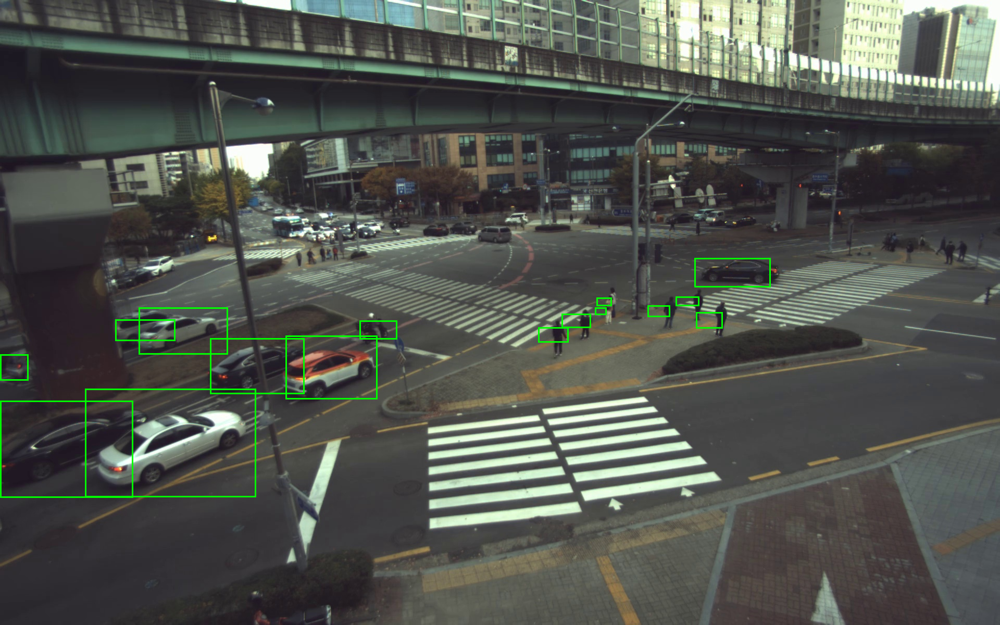

In [11]:
images = sorted(glob.glob('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/images/*.jpg'))
labels = sorted(glob.glob('/data/NIA50/50-2/data/NIA50/train_1st/yolov5/labels/*.txt'))

def xywhn2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    x = np.array(x).reshape(1, -1)
    y = np.copy(x)
    y[:, 0] = (x[:, 0] - x[:, 2] / 2) * 1920 # top left x
    y[:, 1] = (x[:, 1] - x[:, 3] / 2) * 1200 # top left y
    y[:, 2] = (x[:, 0] + x[:, 2] / 2) * 1920 # bottom right x
    y[:, 3] = (x[:, 1] + x[:, 3] / 2) * 1200 # bottom right y
    y = list(y.reshape(-1))
    return y

for image, label in list(zip(images, labels))[0:1]:
    img = Image.open(image).convert('RGB')
    draw = ImageDraw.Draw(img)
    color = (0, 255, 0) 

    with open(label, 'r') as f:
        label_data = f.readlines()

    for j in label_data:
        box = list(map(float, re.sub('\n', '', j).split(' ')[1:]))
        draw.rectangle(xywhn2xyxy(box), outline = color, width = 3)

    # display(img.resize(size=(800, 600)))
    display(img)

# box = 
# img = Image.open(path).convert('RGB')
# draw = ImageDraw.Draw(img)
# color = (0, 255, 0)
# draw.rectangle(xywh2xyxy(box), outline = color, width = 3)

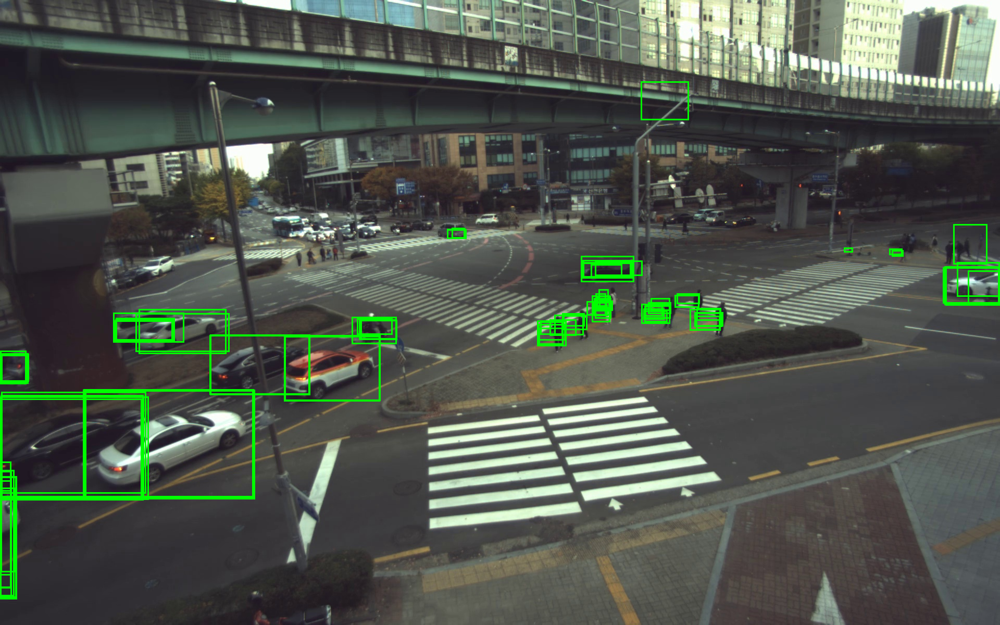

In [9]:
def xywhn2xyxy(x):
    # Convert nx4 boxes from [x, y, w, h] to [x1, y1, x2, y2] where xy1=top-left, xy2=bottom-right
    x = np.array(x).reshape(1, -1)
    y = np.copy(x)
    y[:, 0] = (x[:, 0] - x[:, 2] / 2) * 1920 # top left x
    y[:, 1] = (x[:, 1] - x[:, 3] / 2) * 1200 # top left y
    y[:, 2] = (x[:, 0] + x[:, 2] / 2) * 1920 # bottom right x
    y[:, 3] = (x[:, 1] + x[:, 3] / 2) * 1200 # bottom right y
    y = list(y.reshape(-1))
    return y

image = '/data/NIA50/50-2/data/NIA50/train_1st/yolov5/images/Suwon_A_2210261635_0000_0001.jpg'
label = '/data/NIA50/50-2/models/yolov5/runs/val/nia50_train1st/labels/Suwon_A_2210261635_0000_0001.txt'

img = Image.open(image).convert('RGB')
draw = ImageDraw.Draw(img)
color = (0, 255, 0) 

with open(label, 'r') as f:
    label_data = f.readlines()

for j in label_data:
    box = list(map(float, re.sub('\n', '', j).split(' ')[1:5]))
    draw.rectangle(xywhn2xyxy(box), outline = color, width = 3)

# display(img.resize(size=(800, 600)))
display(img)